# Chapter 2

In [65]:
import pandas as pd
# from IPython.display import display

import seaborn as sns
sns.set_theme(style="ticks")

from plotly.offline import iplot, init_notebook_mode
import plotly_express as ple
init_notebook_mode()

from matplotlib import pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150

## Conceptual

### 1. 第一题

For each of parts (a) through (d), indicate whether we would generally expect the performance of a flexible statistical learning method to be better or worse than an inflexible method. Justify your answer.

(a) The sample size $n$ is extremely large, and the number of predic-tors $p$ is small.

> 好。适合用一个flexible的方法

(b) The number of predictors $p$ is extremely large, and the number of observations $n$ is small.

> 不好。适合一个inflexible的方法。

(c) The relationship between the predictors and response is highly non-linear.

> 好。适合flexible的方法

(d) The variance of the error terms, i.e. $\sigma ^ 2=Var(\epsilon)$, is extremely high.

> 不好。适合替换一个flexible的方法。

### 2. 第二题

Explain whether each scenario is a classification or regression problem, and indicate whether we are most interested in inference or prediction. Finally, provide $n$ and $p$.

(a) We collect a set of data on the top 500 firms in the US. For each firm we record profit, number of employees, industry and the CEO salary. We are interested in understanding which factors affect CEO salary.

> 一个回归问题，比较在意的是解释模型而不是预测模型。

(b) We are considering launching a new product and wish to know whether it will be a success or a failure. We collect data on 20 similar products that were previously launched. For each product we have recorded whether it was a success or failure, price charged for the product, marketing budget, competition price,and ten other variables.

> 分类问题。比较在意预测。

(c) We are interesting in predicting the % change in the US dollar inrelation to the weekly changes in the world stock markets. Hence we collect weekly data for all of 2012. For each week we record the % change in the dollar, the % change in the US market,the % change in the British market, and the % change in the German market.

> 回归问题。预测。


### 3. 第三题

We now revisit the bias-variance decomposition.

(a) Provide a sketch of typical (squared) bias, variance, training error, test error, and Bayes (or irreducible) error curves, on a single plot, as we go from less flexible statistical learning methods towards more flexible approaches. The x-axis should represent the amount of flexibility in the method, and the y-axis should represent the values for each curve. There should be five curves. Make sure to label each one.

> squared bias：会越来越小
>
> variance: 越来越大
>
> training error: 越来越小
> 
> test error: 先变小再变大
> 
> 贝叶斯错误曲线： 直线

(b) Explain why each of the five curves has the shape displayed inpart (a).




### 4. 第四题

You will now think of some real-life applications for statistical learning.

(a) Describe three real-life applications in which classification might be useful. Describe the response, as well as the predictors. Is the goal of each application inference or prediction? Explain your answer.

> 1. 识别数字：图片像素
> 2. 判断一个零件是否有问题：零件形状、质量、表面张力
> 3. 判断用户是否明天会流失：登录天数、今日PV、有没有参与每日活动

(b) Describe three real-life applications in which regression might be useful. Describe the response, as well as the predictors. Is the goal of each application inference or prediction? Explain youranswer.

> 1. 预测房价：房子的地理位置、与最近学校的距离，与最近医院的距离
> 2. 预测明日公司收益：过去收益时间序列
> 3. 衡量公司运营状况的最关键因素：收益、员工数量、与外界公司对接数

(c) Describe three real-life applications in which cluster analysis might be useful.

> 1. 区分国家发展等级
> 2. 区分用户质量
> 3. 区分

## Applied

### 8. College数据集

This exercise relates to the `College` data set, which can be found inthe file `College.csv`. It contains a number of variables for 777 different universities and colleges in the US. The variables are

- `Private`: Public/private indicator
- `Apps`: Number of applications received
- `Accept`: Number of applicants accepted
- `Enroll`: Number of new students enrolled
- `Top10perc`: New students from top 10 % of high school class
- `Top25perc`: New students from top 25 % of high school class
- `F.Undergrad`: Number of full-time undergraduates
- `P.Undergrad`: Number of part-time undergraduates
- `Outstate`: Out-of-state tuition
- `Room.Board`: Room and board costs
- `Books`: Estimated book costs
- `Personal`: Estimated personal spending
- `PhD`: Percent of faculty with Ph.D.’s
- `Terminal`: Percent of faculty with terminal degree
- `S.F.Ratio`: Student/faculty ratio
- `perc.alumni`: Percent of alumni who donate
- `Expend`: Instructional expenditure per student
- `Grad.Rate`: Graduation rate

Before reading the data into `R`, it can be viewed in Excel or a text editor.

(a) Use the `read.csv()` function to read the data into `R`. Call the loaded data `college`. Make sure that you have the directory setto the correct location for the data.


In [4]:
college = pd.read_csv("datasets/College.csv")

(b) Look at the data using the `fix()` function. You should notice that the first column is just the name of each university. We don’t really want `R` to treat this as data. However, it may be handy to have these names for later. Try the following commands:

```r
> rownames(college)=college[,1]
> fix(college)
```

In [5]:
college.index = college.iloc[:, 0]
college.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 19 columns):
Unnamed: 0     777 non-null object
Private        777 non-null object
Apps           777 non-null int64
Accept         777 non-null int64
Enroll         777 non-null int64
Top10perc      777 non-null int64
Top25perc      777 non-null int64
F.Undergrad    777 non-null int64
P.Undergrad    777 non-null int64
Outstate       777 non-null int64
Room.Board     777 non-null int64
Books          777 non-null int64
Personal       777 non-null int64
PhD            777 non-null int64
Terminal       777 non-null int64
S.F.Ratio      777 non-null float64
perc.alumni    777 non-null int64
Expend         777 non-null int64
Grad.Rate      777 non-null int64
dtypes: float64(1), int64(16), object(2)
memory usage: 121.4+ KB


You should see that there is now a `row.names` column with the name of each university recorded. This means that `R` has given each row a name corresponding to the appropriate university. `R` will not try to perform calculations on the row names. However, we still need to eliminate the first column in the data where thenames are stored. Try

```r
> college=college[,-1]
> fix(college)
```


In [6]:
college = college.iloc[:, 1:]
college.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 18 columns):
Private        777 non-null object
Apps           777 non-null int64
Accept         777 non-null int64
Enroll         777 non-null int64
Top10perc      777 non-null int64
Top25perc      777 non-null int64
F.Undergrad    777 non-null int64
P.Undergrad    777 non-null int64
Outstate       777 non-null int64
Room.Board     777 non-null int64
Books          777 non-null int64
Personal       777 non-null int64
PhD            777 non-null int64
Terminal       777 non-null int64
S.F.Ratio      777 non-null float64
perc.alumni    777 non-null int64
Expend         777 non-null int64
Grad.Rate      777 non-null int64
dtypes: float64(1), int64(16), object(1)
memory usage: 115.3+ KB


Now you should see that the first data column is `Private`. Note that another column labeled `row.names` now appears before the `Private` column. However, this is not a data column but rather the name that `R` is giving to each row.

(c)   

i. Use the `summary()` function to produce a numerical summary of the variables in the data set.

In [7]:
college.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


ii. Use the `pairs()` function to produce a scatterplot matrix of the first ten columns or variables of the data. Recall that you can reference the first ten columns of a matrix `A` using `A[,1:10]`.

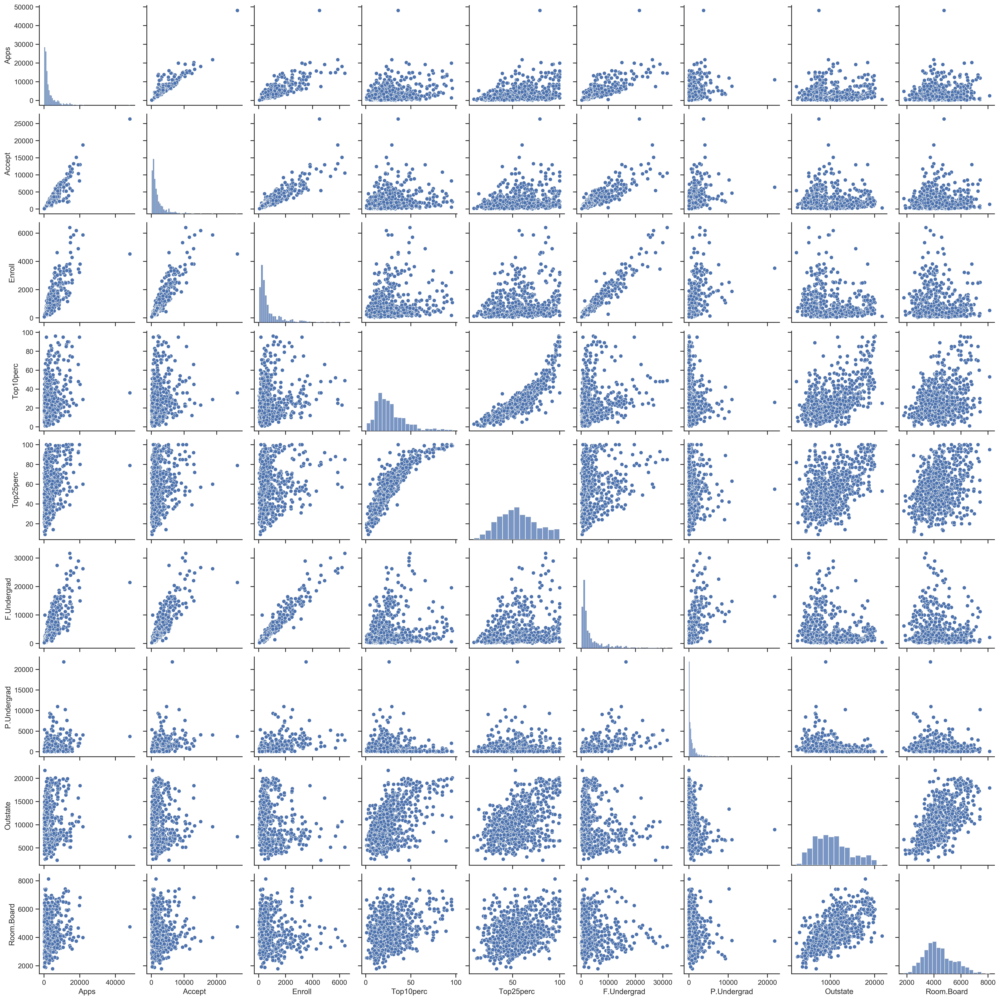

In [64]:
sns.pairplot(college.iloc[:, :10])

In [27]:
ple.scatter_matrix(college.iloc[:, :10])

iii. Use the `plot()` function to produce side-by-side boxplots of `Outstate` versus `Private`.

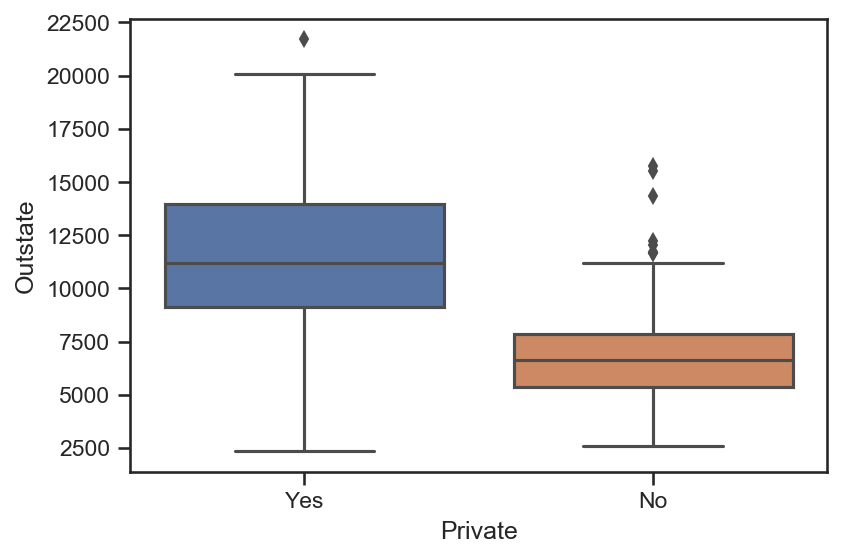

In [66]:
sns.boxplot(
    data=college[["Outstate", "Private"]],
    x="Private",
    y="Outstate",
    )

In [15]:
ple.box(
    college[["Outstate", "Private"]],
    x="Private",
    y="Outstate",
    color="Private"
)

iv. Create a new qualitative variable, called `Elite`, by *binning* the `Top10perc` variable. We are going to divide universities into two groups based on whether or not the proportion of students coming from the top 10 % of their high school classes exceeds 50 %.

```r
> Elite=rep("No",nrow(college))
> Elite[college$Top10perc >50]="Yes"
> Elite=as.factor(Elite)
> college=data.frame(college ,Elite)
```

Use the `summary()` function to see how many elite universities there are. Now use the `plot()` function to produces ide-by-side boxplots of `Outstate` versus `Elite`.

In [28]:
Elite = college["Top10perc"].apply(lambda x: "Yes" if x > 50 else "No").astype("category")
college.insert(len(college.columns), "Elite", Elite)
college.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 19 columns):
Private        777 non-null object
Apps           777 non-null int64
Accept         777 non-null int64
Enroll         777 non-null int64
Top10perc      777 non-null int64
Top25perc      777 non-null int64
F.Undergrad    777 non-null int64
P.Undergrad    777 non-null int64
Outstate       777 non-null int64
Room.Board     777 non-null int64
Books          777 non-null int64
Personal       777 non-null int64
PhD            777 non-null int64
Terminal       777 non-null int64
S.F.Ratio      777 non-null float64
perc.alumni    777 non-null int64
Expend         777 non-null int64
Grad.Rate      777 non-null int64
Elite          777 non-null category
dtypes: category(1), float64(1), int64(16), object(1)
memory usage: 136.2+ KB


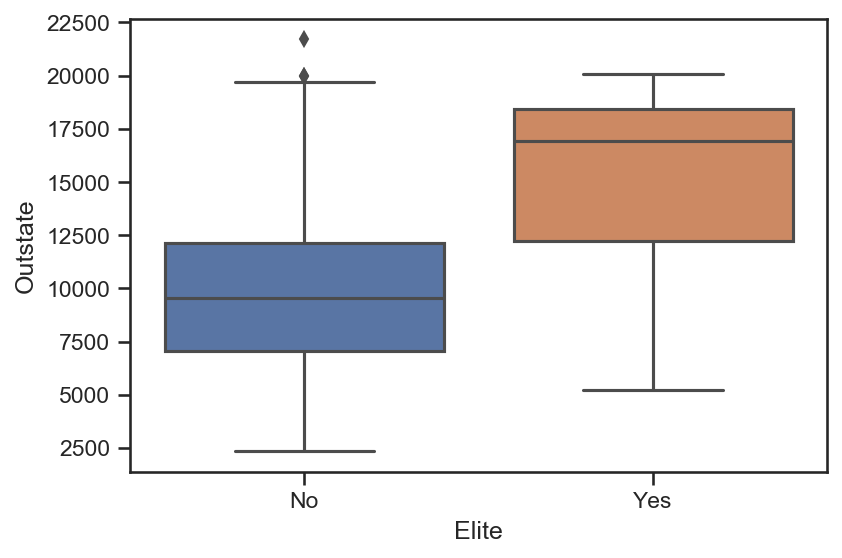

In [67]:
sns.boxplot(
    data=college[["Outstate", "Elite"]],
    x="Elite",
    y="Outstate",
    )

In [33]:
ple.box(
    college[["Outstate", "Elite"]],
    x="Elite",
    y="Outstate",
    color="Elite"
)

v. Use the `hist()` function to produce some histograms with differing numbers of bins for a few of the quantitative variables. You may find the command `par(mfrow=c(2,2))` useful: it will divide the print window into four regions so that fourplots can be made simultaneously. Modifying the argumentsto this function will divide the screen in other ways.

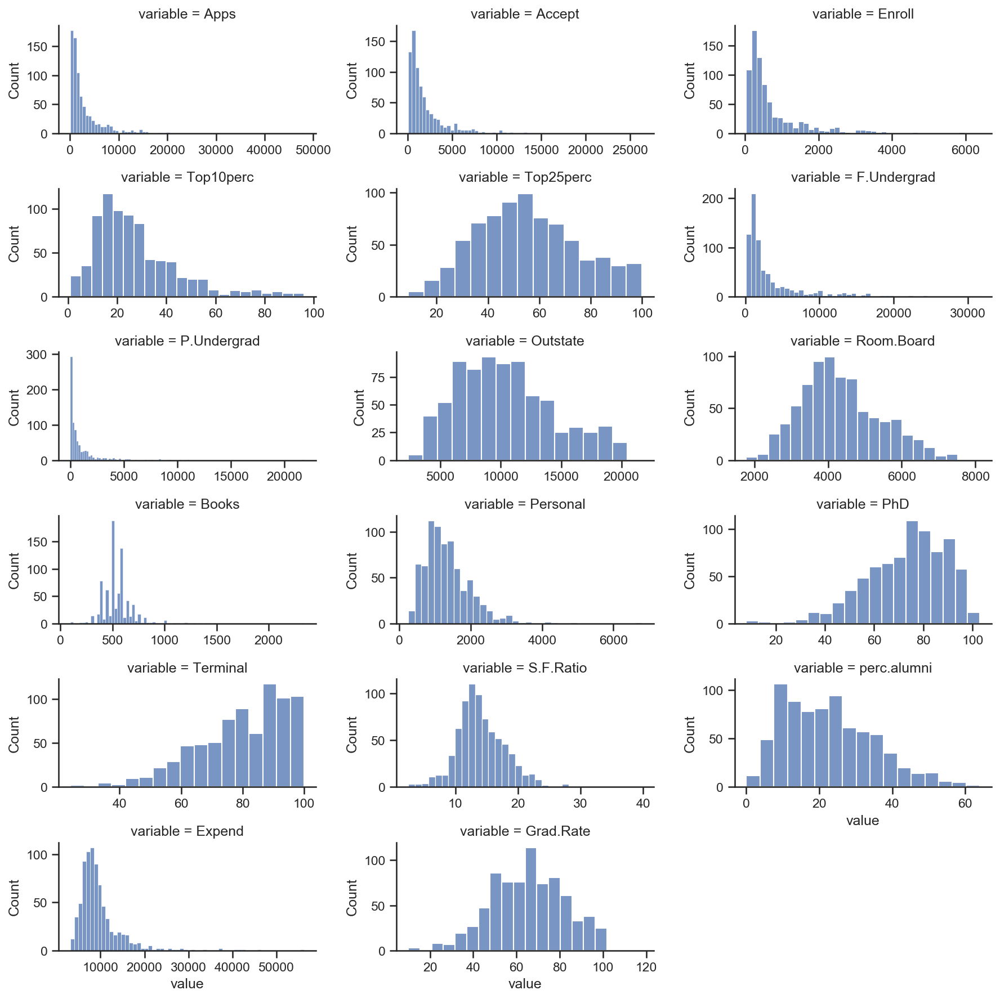

In [75]:
tmp_df = college.iloc[:, 1:-1].melt()
g = sns.FacetGrid(
    tmp_df,
    col="variable",
    col_wrap=3,
    height=2,
    aspect=2,
    sharex=False,
    sharey=False)
g.map(sns.histplot, 'value')

D:\ProgramData\Anaconda3\envs\stats\lib\site-packages\seaborn\axisgrid.py:670: UserWarning:

Using the violinplot function without specifying `order` is likely to produce an incorrect plot.

D:\ProgramData\Anaconda3\envs\stats\lib\site-packages\seaborn\axisgrid.py:675: UserWarning:

Using the violinplot function without specifying `hue_order` is likely to produce an incorrect plot.



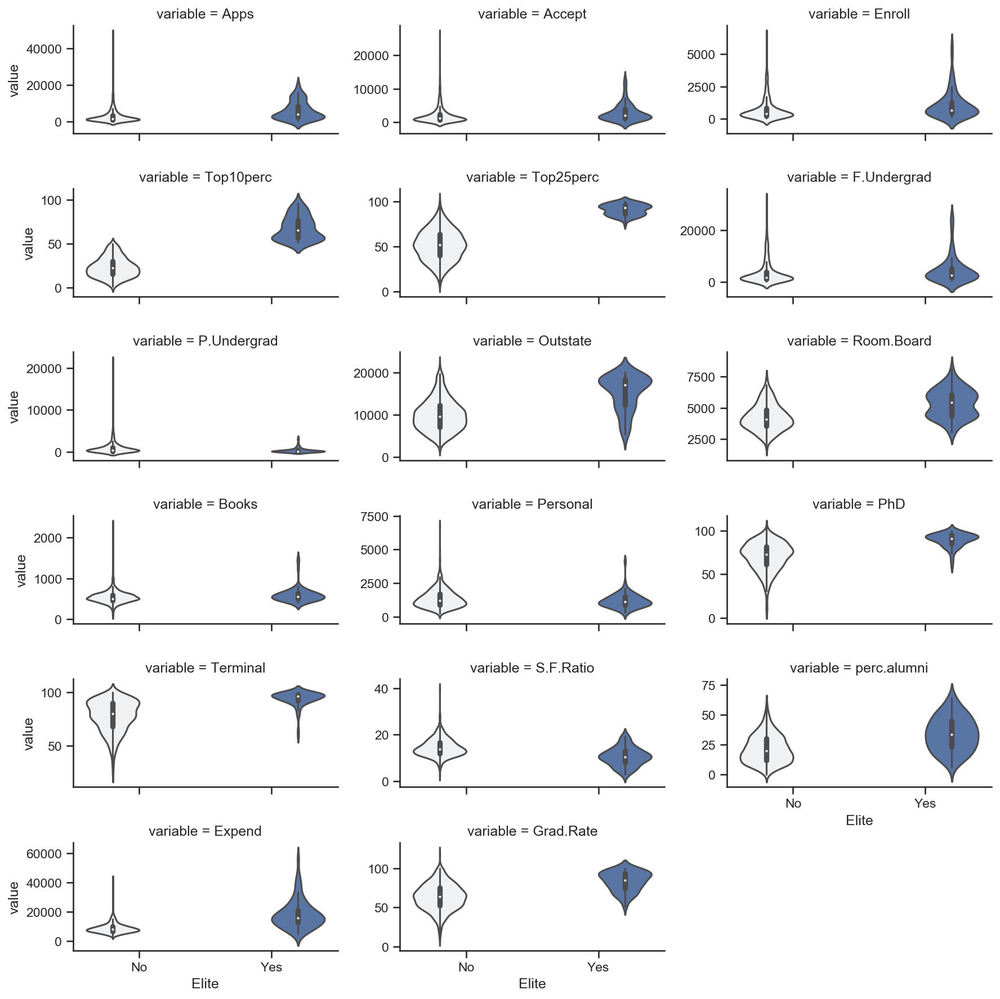

In [91]:
tmp_df = college.iloc[:, 1:].melt(id_vars="Elite")
tmp_df
g = sns.FacetGrid(
    tmp_df,
    col="variable",
    col_wrap=3,
    height=2,
    aspect=2,
    sharey=False)
g.map(sns.violinplot, "Elite", "value", "Elite")

# sns.violinplot(x="variable", y="value", hue="Elite", data=tmp_df)

vi. Continue exploring the data, and provide a brief summary of what you discover.

1. 除了Personal Spending之外，大部分变量都和最后的好坏有关。
2. **Top25perc**最为明显。

### 9. Auto数据集

This exercise involves theAutodata set studied in the lab. Make sure that the missing values have been removed from the data.

(a) Which of the predictors are quantitative, and which are qualitative?

In [93]:
auto = pd.read_csv("datasets/Auto.csv")
auto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397 entries, 0 to 396
Data columns (total 9 columns):
mpg             397 non-null float64
cylinders       397 non-null int64
displacement    397 non-null float64
horsepower      397 non-null object
weight          397 non-null int64
acceleration    397 non-null float64
year            397 non-null int64
origin          397 non-null int64
name            397 non-null object
dtypes: float64(3), int64(4), object(2)
memory usage: 28.0+ KB


> `horsepower`和`name`是定性数据，其余是定量数据

(b) What is the range of each quantitative predictor? You can an-swer this using the `range()` function.

(c) What is the mean and standard deviation of each quantitative predictor?

In [94]:
auto.describe()

,mpg,cylinders,displacement,weight,acceleration,year,origin
count,397.000000,397.000000,397.000000,397.000000,397.000000,397.000000,397.000000
mean,23.515869,5.458438,193.532746,2970.261965,15.555668,75.994962,1.574307
std,7.825804,1.701577,104.379583,847.904119,2.749995,3.690005,0.802549
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.000000,2223.000000,13.800000,73.000000,1.000000
50%,23.000000,4.000000,146.000000,2800.000000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3609.000000,17.100000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


(d) Now remove the 10th through 85th observations. What is the range, mean, and standard deviation of each predictor in thesubset of the data that remains?

In [101]:
auto.drop([9, 84]).describe()

,mpg,cylinders,displacement,weight,acceleration,year,origin
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,23.528608,5.455696,193.279747,2970.237975,15.571139,76.020253,1.572152
std,7.831925,1.699488,104.061132,847.764300,2.733497,3.681425,0.800846
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.500000,2224.500000,13.850000,73.000000,1.000000
50%,23.000000,4.000000,146.000000,2800.000000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3607.000000,17.150000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


(e) Using the full data set, investigate the predictors graphically, using scatterplots or other tools of your choice. Create some plots highlighting the relationships among the predictors. Commenton your findings.


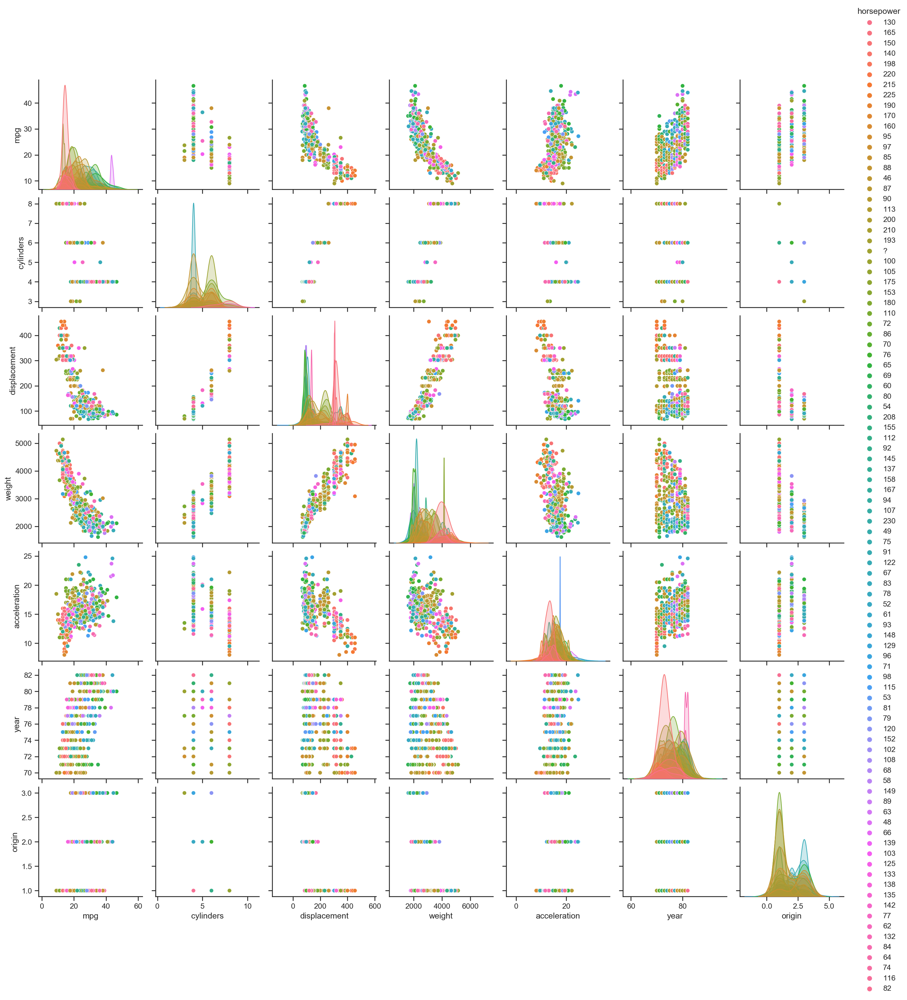

In [105]:
sns.pairplot(auto, hue="horsepower")

(f)Suppose that we wish to predict gas mileage (`mpg`) on the basis of the other variables. Do your plots suggest that any of the other variables might be useful in predicting `mpg`? Justify youranswer.

In [106]:
auto.corr()

,mpg,cylinders,displacement,weight,acceleration,year,origin
mpg,1.000000,-0.776260,-0.804443,-0.831739,0.422297,0.581469,0.563698
cylinders,-0.776260,1.000000,0.950920,0.897017,-0.504061,-0.346717,-0.564972
displacement,-0.804443,0.950920,1.000000,0.933104,-0.544162,-0.369804,-0.610664
weight,-0.831739,0.897017,0.933104,1.000000,-0.419502,-0.307900,-0.581265
acceleration,0.422297,-0.504061,-0.544162,-0.419502,1.000000,0.282901,0.210084
year,0.581469,-0.346717,-0.369804,-0.307900,0.282901,1.000000,0.184314
origin,0.563698,-0.564972,-0.610664,-0.581265,0.210084,0.184314,1.000000


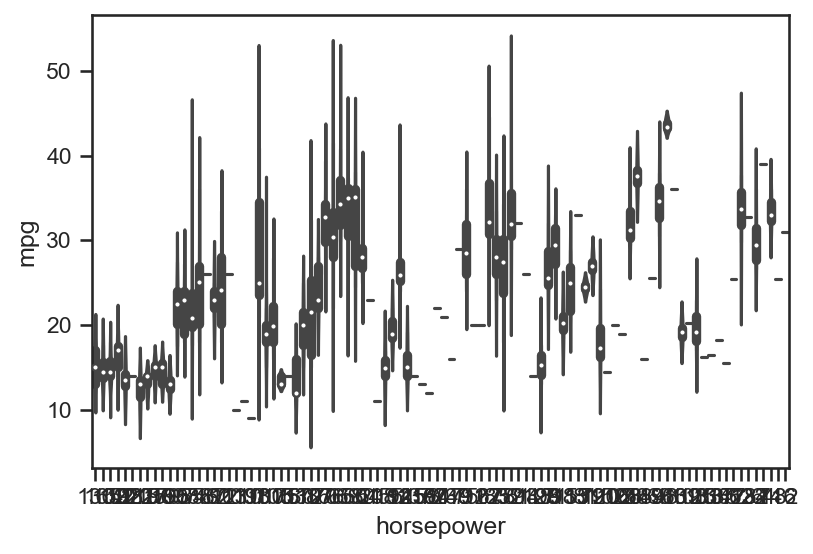

In [110]:
sns.violinplot(x="horsepower", y="mpg", data=auto)

> 所有其他变量均有预测性，其中`cylinders`、`displacement`、`weight`、`horsepower`测效果最好.

### 10. Boston数据集

This exercise involves theBostonhousing data set.
(a) To begin, load in the `Boston` data set. The `Boston` data set is part of the `ISLR2` library.

```r
>library(ISLR2)
```
Now the data set is contained in the object `Boston`.

```r
>Boston
```
Read about the data set:

```r
>?Boston
```
How many rows are in this data set? How many columns? What do the rows and columns represent?

> 有506行、14列。

In [112]:
boston = pd.read_csv("datasets/Boston.csv")
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
crim       506 non-null float64
zn         506 non-null float64
indus      506 non-null float64
chas       506 non-null int64
nox        506 non-null float64
rm         506 non-null float64
age        506 non-null float64
dis        506 non-null float64
rad        506 non-null int64
tax        506 non-null int64
ptratio    506 non-null float64
black      506 non-null float64
lstat      506 non-null float64
medv       506 non-null float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


(b) Make some pairwise scatterplots of the predictors (columns) in this data set. Describe your findings.

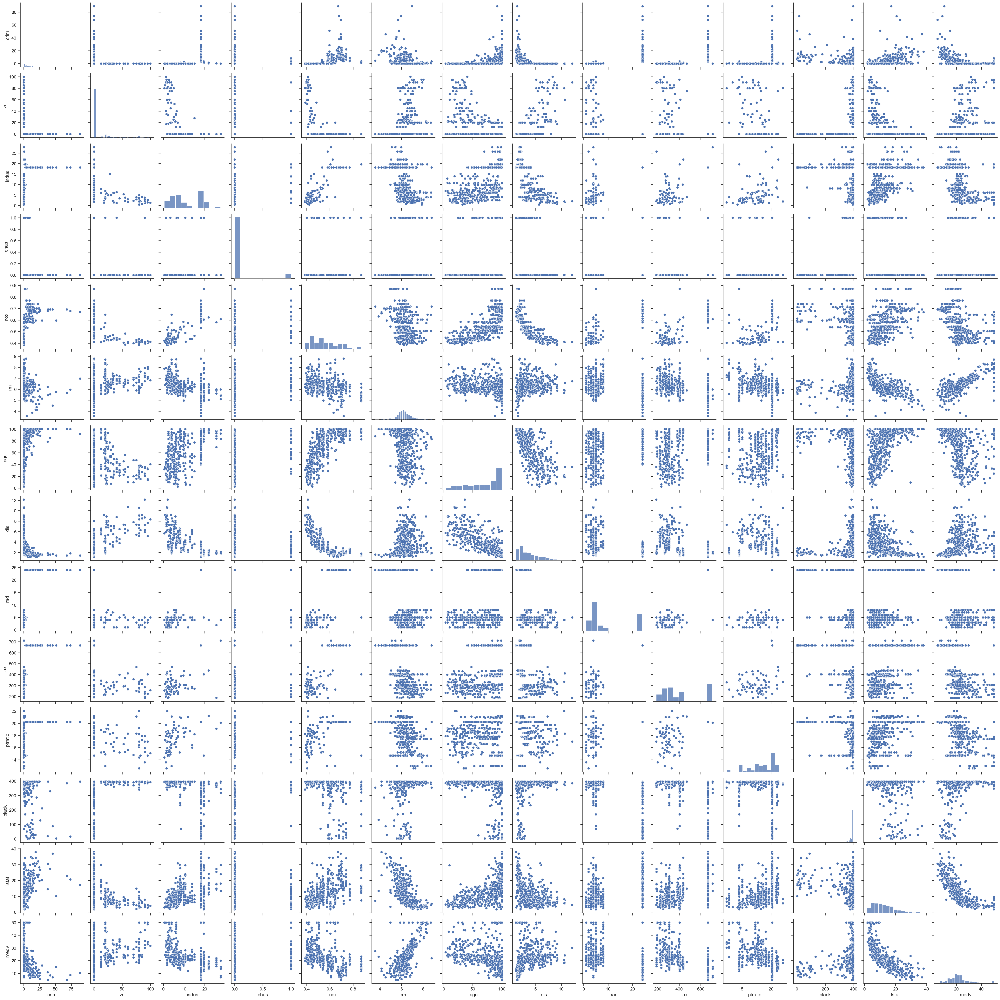

In [113]:
sns.pairplot(boston)

(c)Are any of the predictors associated with per capita crime rate? If so, explain the relationship.

In [114]:
boston.corr()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
crim,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
zn,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
indus,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
chas,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
nox,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
rm,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
age,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
dis,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
rad,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
tax,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


In [116]:
boston.corr("kendall")

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
crim,1.000000,-0.462057,0.521014,0.033948,0.603361,-0.211718,0.497297,-0.539878,0.563969,0.544956,0.312768,-0.264378,0.454837,-0.403964
zn,-0.462057,1.000000,-0.535468,-0.039419,-0.511464,0.278134,-0.429389,0.478524,-0.234663,-0.289911,-0.361607,0.128177,-0.386818,0.339989
indus,0.521014,-0.535468,1.000000,0.075889,0.612030,-0.291318,0.489070,-0.565137,0.353967,0.483228,0.336612,-0.192017,0.465980,-0.418430
chas,0.033948,-0.039419,0.075889,1.000000,0.056387,0.048080,0.055616,-0.065619,0.021739,-0.037655,-0.115694,-0.033277,-0.041344,0.115202
nox,0.603361,-0.511464,0.612030,0.056387,1.000000,-0.215633,0.589608,-0.683930,0.434828,0.453258,0.278678,-0.202430,0.452005,-0.394995
rm,-0.211718,0.278134,-0.291318,0.048080,-0.215633,1.000000,-0.187611,0.179801,-0.076569,-0.190532,-0.223194,0.032951,-0.468231,0.482829
age,0.497297,-0.429389,0.489070,0.055616,0.589608,-0.187611,1.000000,-0.609836,0.306201,0.360311,0.251857,-0.154056,0.485359,-0.387758
dis,-0.539878,0.478524,-0.565137,-0.065619,-0.683930,0.179801,-0.609836,1.000000,-0.361892,-0.381988,-0.223486,0.168631,-0.409347,0.313115
rad,0.563969,-0.234663,0.353967,0.021739,0.434828,-0.076569,0.306201,-0.361892,1.000000,0.558107,0.251913,-0.214364,0.287943,-0.248115
tax,0.544956,-0.289911,0.483228,-0.037655,0.453258,-0.190532,0.360311,-0.381988,0.558107,1.000000,0.287769,-0.241606,0.384191,-0.414650


In [117]:
boston.corr("spearman")

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
crim,1.000000,-0.571660,0.735524,0.041537,0.821465,-0.309116,0.704140,-0.744986,0.727807,0.729045,0.465283,-0.360555,0.634760,-0.558891
zn,-0.571660,1.000000,-0.642811,-0.041937,-0.634828,0.361074,-0.544423,0.614627,-0.278767,-0.371394,-0.448475,0.163135,-0.490074,0.438179
indus,0.735524,-0.642811,1.000000,0.089841,0.791189,-0.415301,0.679487,-0.757080,0.455507,0.664361,0.433710,-0.285840,0.638747,-0.578255
chas,0.041537,-0.041937,0.089841,1.000000,0.068426,0.058813,0.067792,-0.080248,0.024579,-0.044486,-0.136065,-0.039810,-0.050575,0.140612
nox,0.821465,-0.634828,0.791189,0.068426,1.000000,-0.310344,0.795153,-0.880015,0.586429,0.649527,0.391309,-0.296662,0.636828,-0.562609
rm,-0.309116,0.361074,-0.415301,0.058813,-0.310344,1.000000,-0.278082,0.263168,-0.107492,-0.271898,-0.312923,0.053660,-0.640832,0.633576
age,0.704140,-0.544423,0.679487,0.067792,0.795153,-0.278082,1.000000,-0.801610,0.417983,0.526366,0.355384,-0.228022,0.657071,-0.547562
dis,-0.744986,0.614627,-0.757080,-0.080248,-0.880015,0.263168,-0.801610,1.000000,-0.495806,-0.574336,-0.322041,0.249595,-0.564262,0.445857
rad,0.727807,-0.278767,0.455507,0.024579,0.586429,-0.107492,0.417983,-0.495806,1.000000,0.704876,0.318330,-0.282533,0.394322,-0.346776
tax,0.729045,-0.371394,0.664361,-0.044486,0.649527,-0.271898,0.526366,-0.574336,0.704876,1.000000,0.453345,-0.329843,0.534423,-0.562411


> 主要影响是zn、rad、tax、dis、age、nox、lstat这些。

(d) Do any of the census tracts of Boston appear to have particularly high crime rates? Tax rates? Pupil-teacher ratios? Comment onthe range of each predictor.

(e)How many of the census tracts in this data set bound the Charlesriver?

(f)What is the median pupil-teacher ratio among the towns in thisdata set?

(g)Which census tract of Boston has lowest median value of owner-occupied homes? What are the values of the other predictors for that census tract, and how do those values compare to the overall ranges for those predictors? Comment on your findings.

(h)In this data set, how many of the census tracts average more than seven rooms per dwelling? More than eight rooms per dwelling? Comment on the census tracts that average more thaneight rooms per dwelling.

In [118]:
boston.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000
